In [ ]:

# Install & Imports

!pip install -q transformers datasets accelerate

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report

from transformers import (
    BertTokenizerFast,
    BertForSequenceClassification,
    Trainer,
    TrainingArguments,
    EarlyStoppingCallback,
    DataCollatorWithPadding
)

print("GPU Available:", torch.cuda.is_available())

GPU Available: True


In [ ]:
df=pd.read_excel("/content/drive/MyDrive/EmotionDataset/punctuation_augmented_isear.xlsx")

In [ ]:
df.head()

,Unnamed: 0,content,labels,emotion,clean_content
0,0,on days when i feel close to my partner and ot...,5,joy,day feel close partner friend feel peace also ...
1,1,every time i imagine that someone i love or i ...,4,fear,every time imagine someone love could contact ...
2,2,when i had been obviously unjustly treated and...,0,anger,obviously unjustly treated possibility elucida...
3,3,when i think about the short time that we live...,2,sadness,think short time live relate period life think...
4,4,at a gathering i found myself involuntarily si...,1,disgust,gathering found involuntarily sitting next two...


In [ ]:
#  Configuration

MODEL_NAME = "bert-base-uncased"
NUM_LABELS = 7
MAX_LEN = 128              # Increased to preserve context
BATCH_SIZE = 16
EPOCHS = 5                 # Reduced to avoid overfitting
LR = 2e-5
RANDOM_STATE = 42

In [ ]:
# Use RAW content column
X = df['content'].astype(str).values   #  Correct column
y = df['labels'].values

target_names = sorted(df['emotion'].unique())

In [ ]:
#  Stratified Train / Val / Test Split

X_train, X_temp, y_train, y_temp = train_test_split(
    X, y,
    test_size=0.30,
    stratify=y,
    random_state=RANDOM_STATE
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp,
    test_size=0.50,
    stratify=y_temp,
    random_state=RANDOM_STATE
)

In [ ]:
# BERT Tokenizer (Correct Usage)
tokenizer = BertTokenizerFast.from_pretrained(MODEL_NAME)

def tokenize_function(texts):
    return tokenizer(
        list(texts),
        truncation=True,
        max_length=MAX_LEN
    )

train_encodings = tokenize_function(X_train)
val_encodings   = tokenize_function(X_val)
test_encodings  = tokenize_function(X_test)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [ ]:
# Dataset Class

class EmotionDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        item = {key: torch.tensor(val[idx]) for key, val in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx])
        return item

train_dataset = EmotionDataset(train_encodings, y_train)
val_dataset   = EmotionDataset(val_encodings, y_val)
test_dataset  = EmotionDataset(test_encodings, y_test)

In [ ]:
# Model Initialization

model = BertForSequenceClassification.from_pretrained(
    MODEL_NAME,
    num_labels=NUM_LABELS
)

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

BertForSequenceClassification LOAD REPORT from: bert-base-uncased
Key                                        | Status     | 
-------------------------------------------+------------+-
cls.predictions.transform.LayerNorm.weight | UNEXPECTED | 
cls.predictions.transform.dense.weight     | UNEXPECTED | 
cls.seq_relationship.bias                  | UNEXPECTED | 
cls.predictions.bias                       | UNEXPECTED | 
cls.seq_relationship.weight                | UNEXPECTED | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED | 
cls.predictions.transform.dense.bias       | UNEXPECTED | 
classifier.bias                            | MISSING    | 
classifier.weight                          | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


In [ ]:
# Metrics
def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=1)

    acc = accuracy_score(labels, preds)
    precision, recall, f1, _ = precision_recall_fscore_support(
        labels, preds, average="macro"
    )

    return {
        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }

In [ ]:
# Training Arguments (Anti-Overfitting Setup)

training_args = TrainingArguments(
    output_dir="./bert_emotion",

    eval_strategy="epoch",
    save_strategy="epoch",

    learning_rate=LR,
    per_device_train_batch_size=BATCH_SIZE,
    per_device_eval_batch_size=BATCH_SIZE,

    num_train_epochs=EPOCHS,

    weight_decay=0.01,                 # L2 regularization
    warmup_ratio=0.1,                  # Stabilizes early training

    logging_dir="./logs",
    logging_steps=50,

    load_best_model_at_end=True,
    metric_for_best_model="f1",
    greater_is_better=True,

    save_total_limit=1,
    report_to="none"
)

warmup_ratio is deprecated and will be removed in v5.2. Use `warmup_steps` instead.
`logging_dir` is deprecated and will be removed in v5.2. Please set `TENSORBOARD_LOGGING_DIR` instead.


In [ ]:
# Data Collator

data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
# Trainer with Early Stopping

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    data_collator=data_collator,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=2)]
)

In [ ]:
# Train

trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.806784,0.741605,0.747191,0.754952,0.746243,0.746852
2,0.462584,0.504773,0.835896,0.840800,0.835530,0.835656
3,0.217941,0.415638,0.882910,0.884247,0.882498,0.882798
4,0.117119,0.437140,0.902129,0.902219,0.901870,0.901831
5,0.033695,0.449479,0.910112,0.910184,0.909949,0.909990


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

There were missing keys in the checkpoint model loaded: ['bert.embeddings.LayerNorm.weight', 'bert.embeddings.LayerNorm.bias', 'bert.encoder.layer.0.attention.output.LayerNorm.weight', 'bert.encoder.layer.0.attention.output.LayerNorm.bias', 'bert.encoder.layer.0.output.LayerNorm.weight', 'bert.encoder.layer.0.output.LayerNorm.bias', 'bert.encoder.layer.1.attention.output.LayerNorm.weight', 'bert.encoder.layer.1.attention.output.LayerNorm.bias', 'bert.encoder.layer.1.output.LayerNorm.weight', 'bert.encoder.layer.1.output.LayerNorm.bias', 'bert.encoder.layer.2.attention.output.LayerNorm.weight', 'bert.encoder.layer.2.attention.output.LayerNorm.bias', 'bert.encoder.layer.2.output.LayerNorm.weight', 'bert.encoder.layer.2.output.LayerNorm.bias', 'bert.encoder.layer.3.attention.output.LayerNorm.weight', 'bert.encoder.layer.3.attention.output.LayerNorm.bias', 'bert.encoder.layer.3.output.LayerNorm.weight', 'bert.encoder.layer.3.output.LayerNorm.bias', 'bert.encoder.layer.4.attention.output.La

TrainOutput(global_step=4935, training_loss=0.44147583530062723, metrics={'train_runtime': 1079.1087, 'train_samples_per_second': 73.121, 'train_steps_per_second': 4.573, 'total_flos': 2427952895379900.0, 'train_loss': 0.44147583530062723, 'epoch': 5.0})

In [ ]:
# Test Evaluation

test_results = trainer.predict(test_dataset)

y_test_pred = np.argmax(test_results.predictions, axis=1)

print(classification_report(
    y_test,
    y_test_pred,
    target_names=target_names
))

              precision    recall  f1-score   support

       anger       0.88      0.88      0.88       486
     disgust       0.88      0.92      0.90       479
     sadness       0.89      0.93      0.91       487
       shame       0.88      0.84      0.86       482
        fear       0.94      0.91      0.92       485
         joy       0.95      0.94      0.94       491
       guilt       0.87      0.88      0.88       472

    accuracy                           0.90      3382
   macro avg       0.90      0.90      0.90      3382
weighted avg       0.90      0.90      0.90      3382



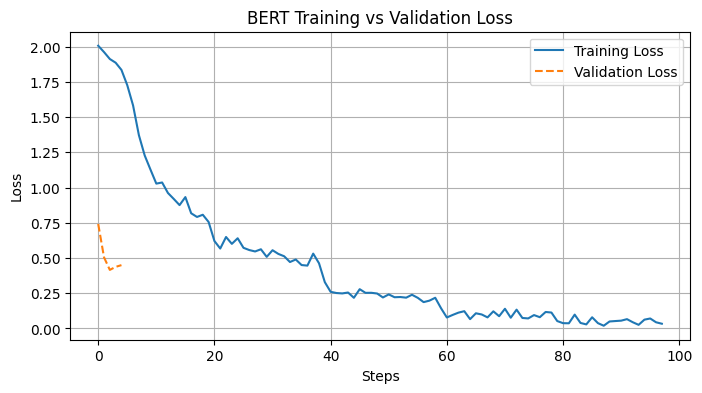

In [ ]:
#  Plot Loss Curve

logs = trainer.state.log_history

train_loss = [x["loss"] for x in logs if "loss" in x]
eval_loss  = [x["eval_loss"] for x in logs if "eval_loss" in x]

plt.figure(figsize=(8,4))
plt.plot(train_loss, label="Training Loss")
plt.plot(eval_loss, label="Validation Loss", linestyle="--")
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("BERT Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
MODEL_DIR = "/content/drive/MyDrive/Models/Final_BERT_model-20/2/2026"
RESULTS_DIR = "/content/drive/MyDrive/Models_Results"

In [ ]:
trainer.save_model(MODEL_DIR)
tokenizer.save_pretrained(MODEL_DIR)

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

('/content/drive/MyDrive/Models/Final_BERT_model-20/2/2026/tokenizer_config.json',
 '/content/drive/MyDrive/Models/Final_BERT_model-20/2/2026/tokenizer.json')

some tests

In [ ]:
!pip install -q shap

In [ ]:
import torch.nn.functional as F

def predict_proba(texts):
    # 1. Ensure texts is a list of Python strings
    if isinstance(texts, str):
        texts = [texts]
    elif isinstance(texts, np.ndarray):
        texts = texts.tolist()
    texts = [str(text) for text in texts] # Explicitly convert all to string

    # 2. Tokenize the input texts
    inputs = tokenizer(
        texts,
        padding=True,
        truncation=True,
        max_length=MAX_LEN,
        return_tensors="pt"
    )

    # 3. Move inputs to the same device as the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    model.to(device)

    # 4. Set model to evaluation mode
    model.eval()

    # 5. Make predictions
    with torch.no_grad():
        outputs = model(**inputs)

    # 6. Get predicted probabilities
    logits = outputs.logits
    probabilities = F.softmax(logits, dim=1)

    # 7. Convert to NumPy array and return
    return probabilities.cpu().numpy()

print("predict_proba function defined for SHAP.")

predict_proba function defined for SHAP.


In [ ]:
# Create a mapping from numerical labels to emotion names based on the DataFrame
label_to_emotion = df[['labels', 'emotion']].drop_duplicates().sort_values('labels')
target_names = label_to_emotion['emotion'].tolist()

print("Corrected target_names mapping:", target_names)
print("Please re-run the following cells to see the updated predictions and SHAP plots:")
print("- Test Evaluation (Cell L7aTtyM7uBzQ)")
print("- New Samples Prediction (Cell uC5ErwxSygGx)")
print("- SHAP Waterfall Plots (Cell dde3260d)")

Corrected target_names mapping: ['anger', 'disgust', 'sadness', 'shame', 'fear', 'joy', 'guilt']
Please re-run the following cells to see the updated predictions and SHAP plots:
- Test Evaluation (Cell L7aTtyM7uBzQ)
- New Samples Prediction (Cell uC5ErwxSygGx)
- SHAP Waterfall Plots (Cell dde3260d)


In [ ]:
import shap

# Initialize SHAP Text masker
# Pass the tokenizer object directly for Hugging Face tokenizers.
masker = shap.maskers.Text(tokenizer, mask_token=tokenizer.mask_token)

# Initialize SHAP Explainer
explainer = shap.Explainer(predict_proba, masker, output_names=target_names)

print("SHAP masker and explainer initialized.")

# Select a few representative samples for explanation
# Using samples from the test set (X_test) and some custom samples for variety
sample_texts = [
    X_test[0], # A sample from the test set
    X_test[1], # Another sample from the test set
    new_samples[0], # Custom 'happy' sample
    new_samples[1]  # Custom 'angry' sample
]

print(f"Selected {len(sample_texts)} samples for SHAP explanation.")

SHAP masker and explainer initialized.
Selected 4 samples for SHAP explanation.


In [ ]:
print("Computing SHAP values. This may take a while...")
shap_values = explainer(sample_texts)
print("SHAP values computed.")

Computing SHAP values. This may take a while...
SHAP values computed.


Generating SHAP waterfall plots...


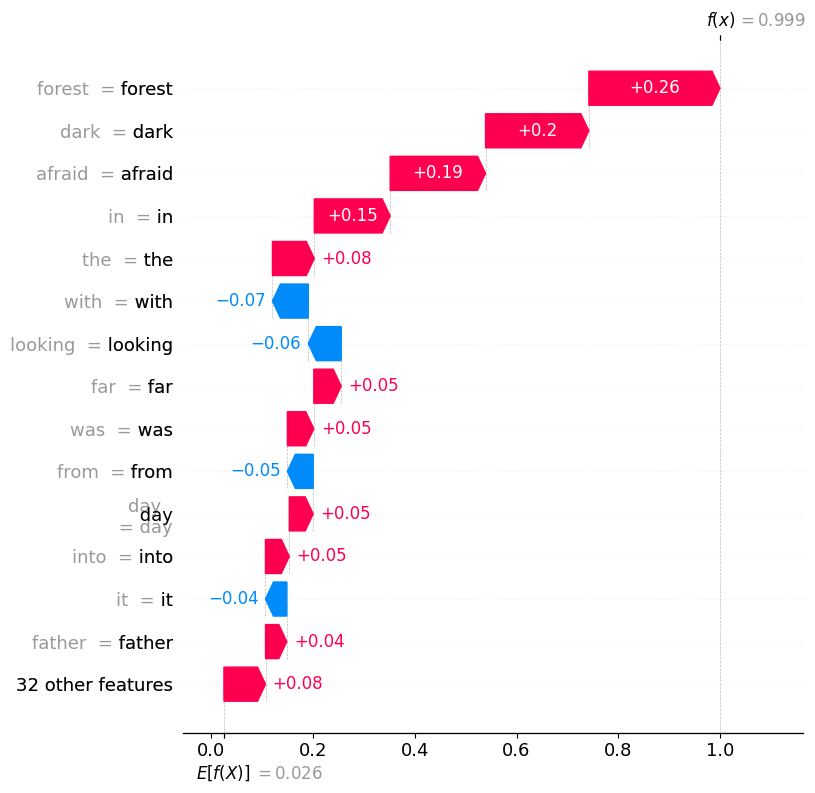

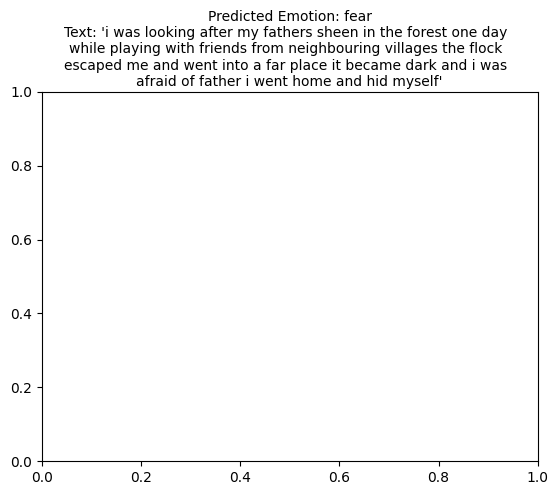

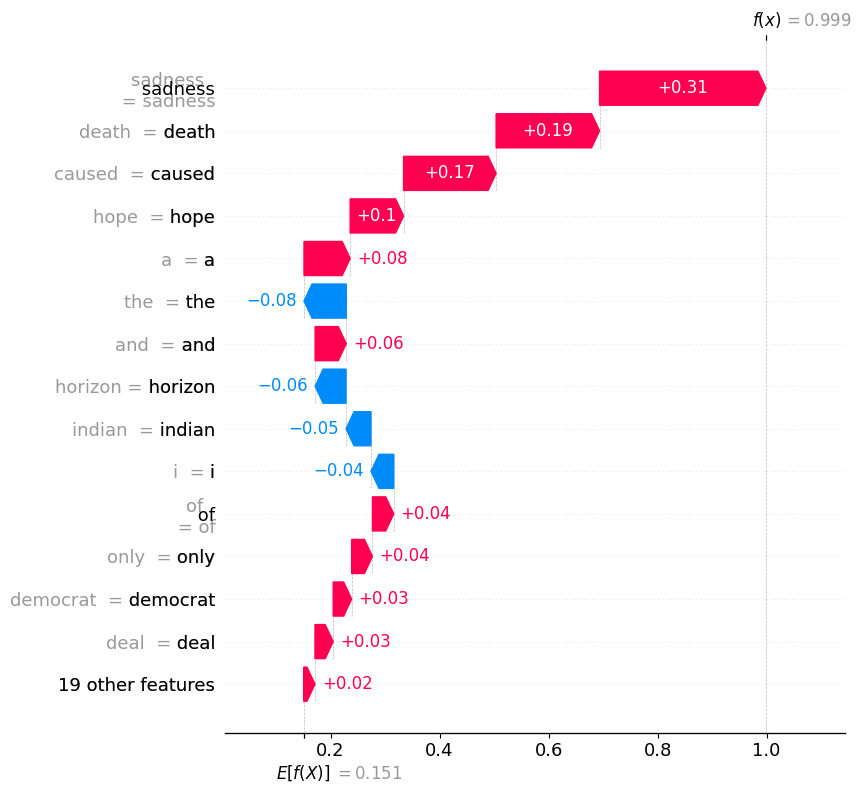

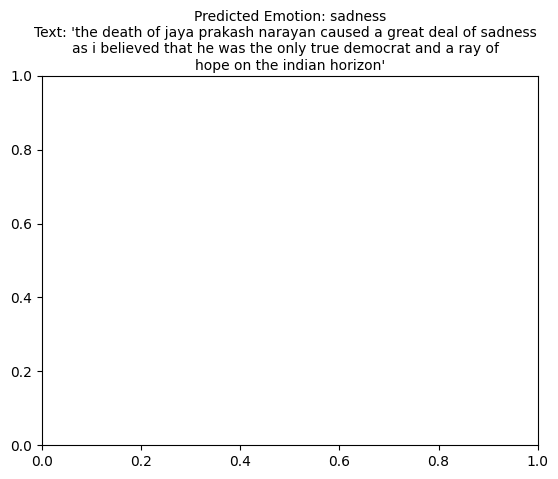

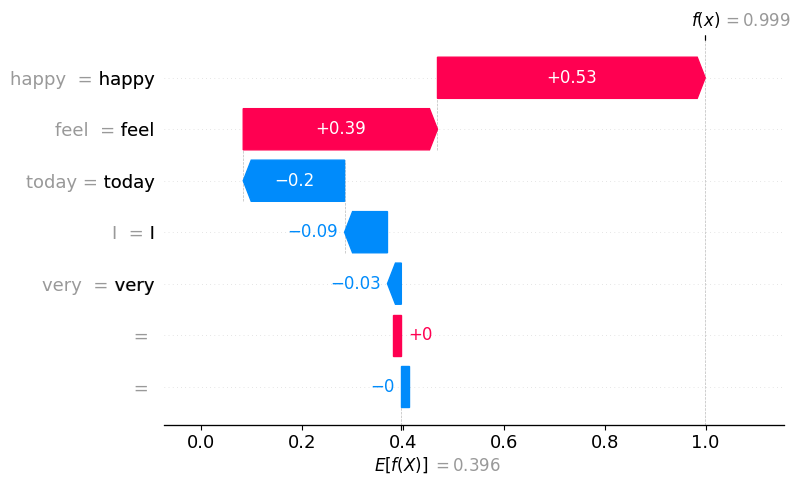

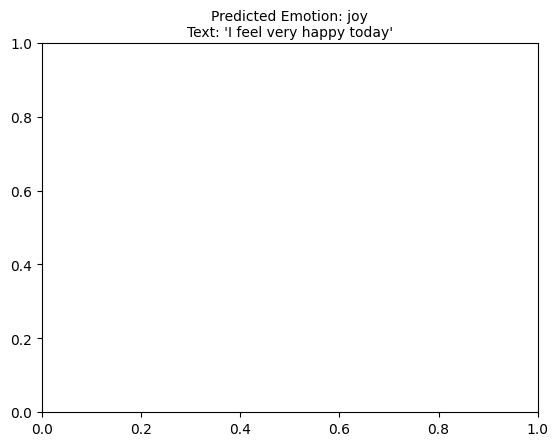

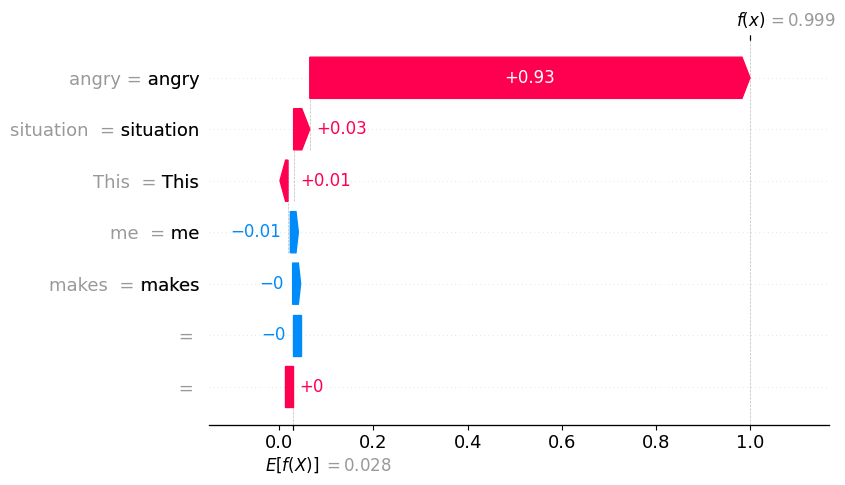

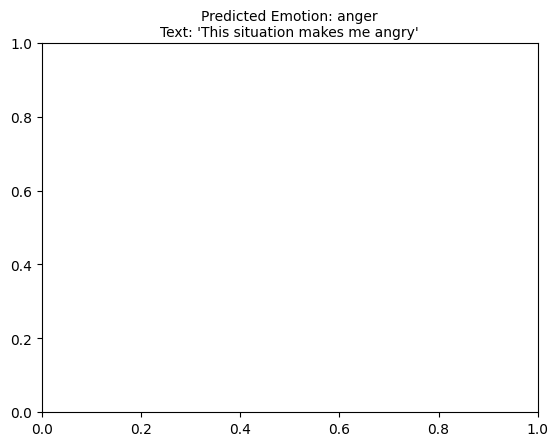

SHAP waterfall plots generated.


In [ ]:
import matplotlib.pyplot as plt

print("Generating SHAP waterfall plots...")

# Loop through each sample and its SHAP explanation
for i, text in enumerate(sample_texts):
    # Get the model's prediction for the current text
    # predict_proba returns probabilities for all classes
    probabilities = predict_proba(text)
    predicted_emotion_idx = np.argmax(probabilities)
    predicted_emotion_name = target_names[predicted_emotion_idx]

    # Extract the full explanation for the current sample
    current_sample_explanation = shap_values[i]

    # Create a new Explanation object for only the predicted emotion
    # Removed 'main_effects' and 'interaction_values' as they cause AttributeError
    single_output_explanation = shap.Explanation(
        values=current_sample_explanation.values[:, predicted_emotion_idx],
        base_values=current_sample_explanation.base_values[predicted_emotion_idx],
        data=current_sample_explanation.data,
        feature_names=current_sample_explanation.feature_names
    )

    # Display the waterfall plot for the current sample's predicted emotion
    shap.plots.waterfall(single_output_explanation, max_display=15)

    # Set the title to include the predicted emotion and the sentence
    plt.title(f"Predicted Emotion: {predicted_emotion_name}\nText: '{text}'", fontsize=10, wrap=True)
    plt.show()

print("SHAP waterfall plots generated.")

## Save SHAP Objects

In [ ]:
import joblib
import os

# Define paths for saving SHAP objects
explainer_path = os.path.join(MODEL_DIR, "shap_explainer.joblib")
shap_values_path = os.path.join(MODEL_DIR, "shap_values.joblib")

# Create the directory if it doesn't exist
os.makedirs(MODEL_DIR, exist_ok=True)

# Save the explainer
joblib.dump(explainer, explainer_path)
print(f"SHAP Explainer saved to: {explainer_path}")

# Save the shap_values (only for the sample_texts, as it can be large)
# If shap_values is a list of Explanation objects, it will be saved as such.
joblib.dump(shap_values, shap_values_path)
print(f"SHAP values for sample_texts saved to: {shap_values_path}")

SHAP Explainer saved to: /content/drive/MyDrive/Models/Final_BERT_model-20/2/2026/shap_explainer.joblib
SHAP values for sample_texts saved to: /content/drive/MyDrive/Models/Final_BERT_model-20/2/2026/shap_values.joblib


## SHAP Bar Plots for Individual Explanations

Generating SHAP bar plots...


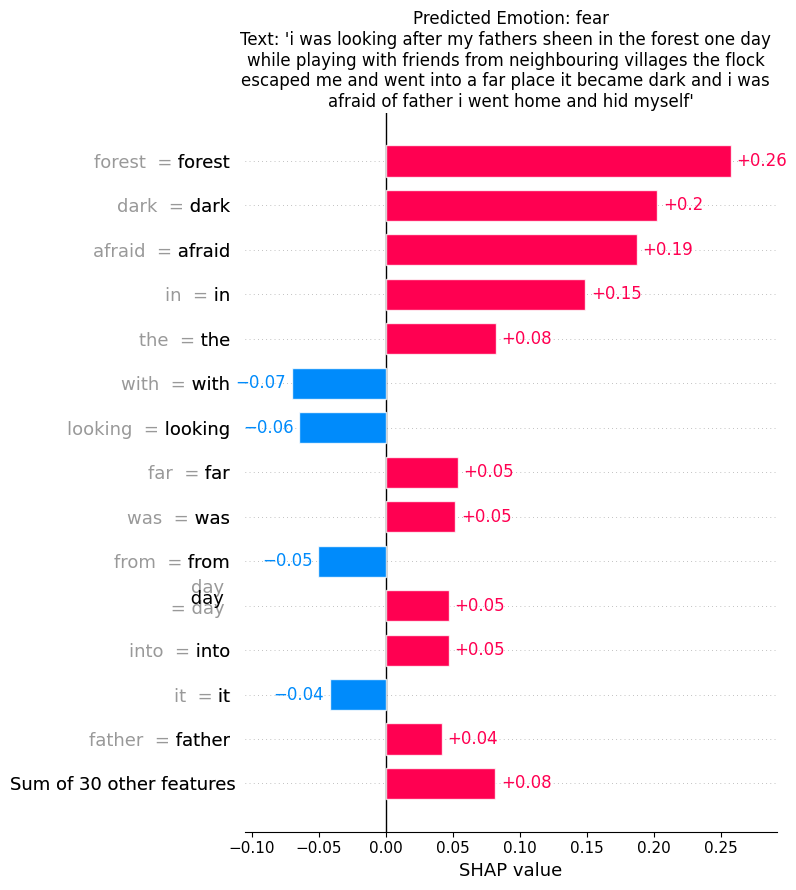

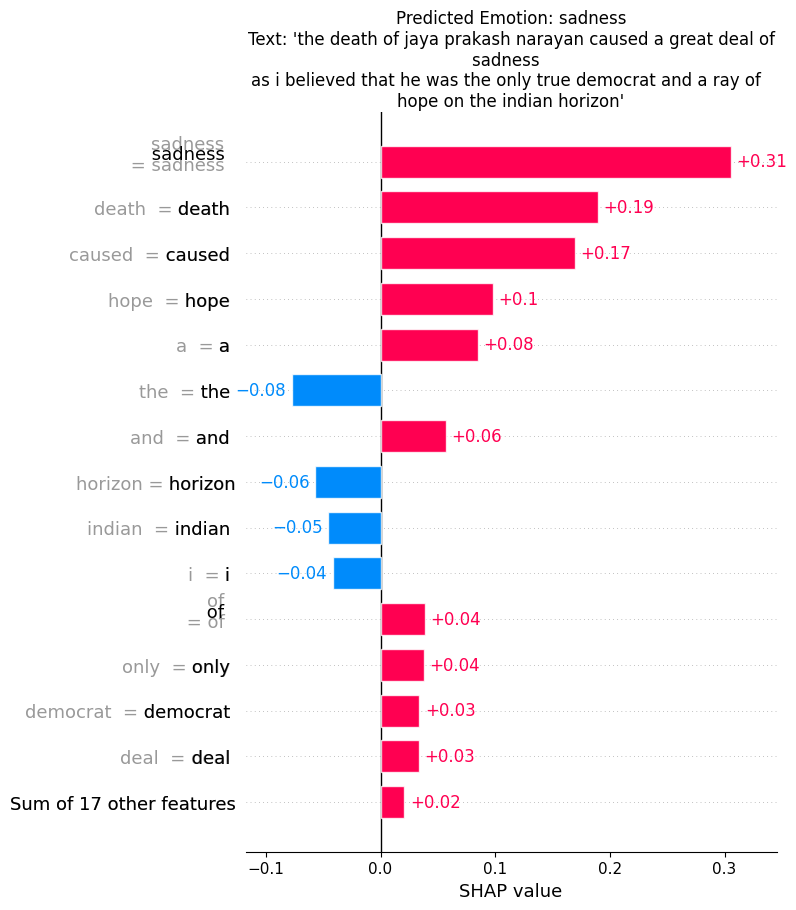

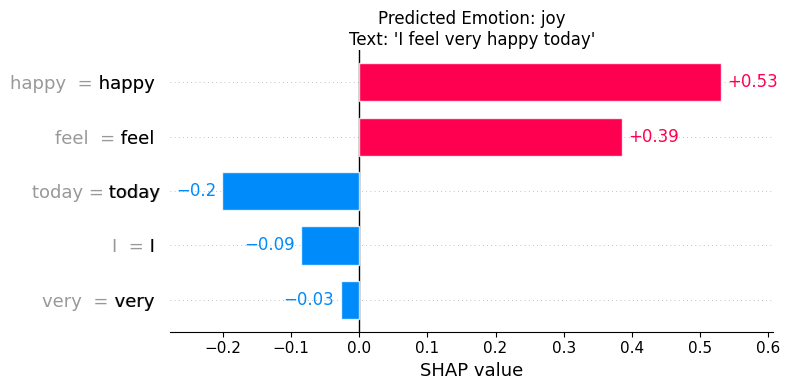

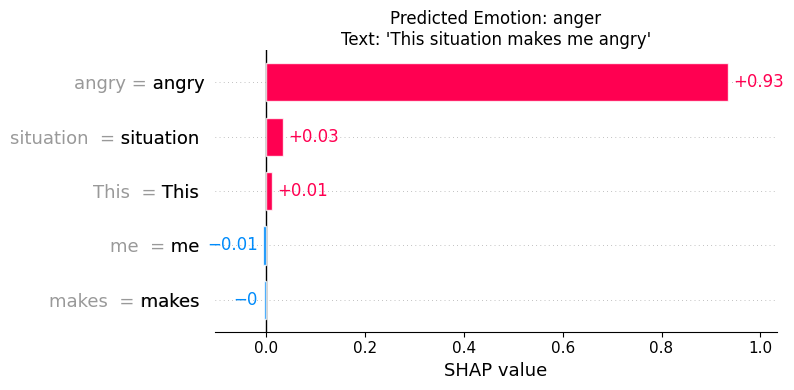

SHAP bar plots generated.


In [ ]:
import matplotlib.pyplot as plt

print("Generating SHAP bar plots...")

# Loop through each sample and its SHAP explanation
for i, text in enumerate(sample_texts):
    # Get the model's prediction for the current text
    probabilities = predict_proba(text)
    predicted_emotion_idx = np.argmax(probabilities)
    predicted_emotion_name = target_names[predicted_emotion_idx]

    # Get the full explanation for the current sample
    current_sample_explanation = shap_values[i]

    # Extract tokens (data) and their corresponding SHAP values for the predicted class
    tokens = current_sample_explanation.data
    shap_values_for_tokens = current_sample_explanation.values[:, predicted_emotion_idx]
    base_value_for_class = current_sample_explanation.base_values[predicted_emotion_idx]

    # Identify non-empty tokens and their indices
    non_empty_indices = [j for j, token in enumerate(tokens) if isinstance(token, str) and token.strip() != '']

    # Filter tokens and SHAP values based on non_empty_indices
    filtered_tokens = [tokens[j] for j in non_empty_indices]
    filtered_shap_values = [shap_values_for_tokens[j] for j in non_empty_indices]

    # Create a new Explanation object with the filtered data and values
    # The base_values are typically not token-specific, so they remain the same.
    cleaned_sample_shap = shap.Explanation(
        values=np.array(filtered_shap_values),
        base_values=base_value_for_class,
        data=np.array(filtered_tokens),
        feature_names=filtered_tokens
    )

    # Plotting with a forced white background
    plt.figure(facecolor='white', figsize=(10, 6))
    shap.plots.bar(cleaned_sample_shap, max_display=15, show=False)

    # Customizing the title
    plt.title(f"Predicted Emotion: {predicted_emotion_name}\nText: '{text}'", fontsize=12, wrap=True, color='black')
    plt.gcf().set_facecolor('white') # Ensure the figure background is white
    plt.tight_layout() # Adjust layout to prevent labels from being cut off
    plt.show()

print("SHAP bar plots generated.")

In [ ]:
new_samples = [
    "I feel very happy today",
    "This situation makes me angry",
    "I feel nervous and scared",
    "I feel empty and hopeless",
    "Nothing special happened today"
]

def predict_emotion(texts):
    # Tokenize the input texts
    inputs = tokenizer(
        texts,
        padding=True,
        truncation=True,
        max_length=MAX_LEN,
        return_tensors="pt"
    )

    # Move inputs to the same device as the model
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    model.to(device)

    # Make predictions
    with torch.no_grad():
        outputs = model(**inputs)

    # Get predicted labels
    logits = outputs.logits
    predictions = torch.argmax(logits, dim=1).cpu().numpy()

    # Map numerical predictions to emotion names
    predicted_emotions = [target_names[pred] for pred in predictions]
    return predicted_emotions

# Get predictions for the new samples
predicted_emotions = predict_emotion(new_samples)

# Print the results
for text, emotion in zip(new_samples, predicted_emotions):
    print(f"Text: '{text}' -> Predicted Emotion: {emotion}")

Text: 'I feel very happy today' -> Predicted Emotion: joy
Text: 'This situation makes me angry' -> Predicted Emotion: anger
Text: 'I feel nervous and scared' -> Predicted Emotion: fear
Text: 'I feel empty and hopeless' -> Predicted Emotion: sadness
Text: 'Nothing special happened today' -> Predicted Emotion: guilt


In [ ]:
pip install -q lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
import lime
import lime.lime_text

# Initialize LIME Explainer
lime_explainer = lime.lime_text.LimeTextExplainer(class_names=target_names)

print("LIME Explainer initialized.")

LIME Explainer initialized.


In [ ]:
print("Generating and visualizing LIME explanations...")

# Loop through each sample text
for i, text in enumerate(sample_texts):
    print(f"\nExplaining sample {i+1}/{len(sample_texts)}: '{text}'")

    # Get the model's prediction for the current text to identify the target class
    probabilities = predict_proba(text)
    predicted_emotion_idx = np.argmax(probabilities)
    predicted_emotion_name = target_names[predicted_emotion_idx]

    # Generate LIME explanation for the predicted class
    # num_features: how many words to include in the explanation
    # num_samples: number of perturbed samples to generate (higher for better approximation, but slower)
    explanation = lime_explainer.explain_instance(
        text, # text to explain
        predict_proba, # prediction function
        num_features=10, # number of words to show in explanation
        num_samples=1000, # number of perturbed samples
        labels=[predicted_emotion_idx] # explain only for the predicted class
    )

    # Display the LIME explanation in an interactive way (as HTML) or static (as list)
    # For displaying in Colab, show_in_notebook is useful.
    print(f"Predicted Emotion: {predicted_emotion_name}")
    from IPython.display import display, HTML

    html = explanation.as_html()

    white_bg_html = f"""
     <div style="
     background-color: white;
     color: black;
     padding: 20px;
     border-radius: 8px;
">
    {html}
 </div>
"""

display(HTML(white_bg_html))

print("LIME explanations generated and visualized.")

Generating and visualizing LIME explanations...

Explaining sample 1/4: 'i was looking after my fathers sheen in the forest one day  
while playing with friends from neighbouring villages the flock  
escaped me and went into a far place it became dark and i was  
afraid of father i went home and hid myself'
Predicted Emotion: fear

Explaining sample 2/4: 'the death of jaya prakash narayan caused a great deal of sadness  
as i believed that he was the only true democrat and a ray of  
hope on the indian horizon'
Predicted Emotion: sadness

Explaining sample 3/4: 'I feel very happy today'
Predicted Emotion: joy

Explaining sample 4/4: 'This situation makes me angry'
Predicted Emotion: anger


LIME explanations generated and visualized.


In [ ]:

for i, text in enumerate(sample_texts):



    # Correct probability call
    probabilities = predict_proba([text])[0]
    predicted_emotion_idx = np.argmax(probabilities)
    predicted_emotion_name = target_names[predicted_emotion_idx]

    explanation = lime_explainer.explain_instance(
        text_instance=text,
        classifier_fn=predict_proba,
        num_features=10,
        num_samples=1000,
        labels=[predicted_emotion_idx]
    )


    explanation.show_in_notebook(
        text=True,
        labels=[predicted_emotion_idx]
    )

print("LIME explanations generated and visualized.")

LIME explanations generated and visualized.


In [ ]:
import joblib
import os

# Define paths for saving LIME objects
lime_explainer_path = os.path.join(MODEL_DIR, "lime_explainer.joblib")
lime_explanations_path = os.path.join(MODEL_DIR, "lime_explanations.joblib")

# Create the directory if it doesn't exist (MODEL_DIR should already exist from SHAP saving)
os.makedirs(MODEL_DIR, exist_ok=True)

# The LIME explainer object often contains unpicklable elements.
# Instead of saving the explainer itself, we will rely on re-initializing it
# with `class_names` and the `predict_proba` function if needed later.
# joblib.dump(lime_explainer, lime_explainer_path) # Removed due to PicklingError
# print(f"LIME Explainer saved to: {lime_explainer_path}")

# LIME explanations are generated one by one. To save them, we need to collect them first.
# For this subtask, we will only save the explainer (if possible) and note that explanations
# are not collected for bulk saving. Given the pickling issue with lime_explainer, we will
# explicitly state it is not saved.
print("Note: The LIME Explainer object cannot be directly pickled due to internal functions and will not be saved. Individual LIME explanation objects were generated and displayed but not collected for bulk saving.")


Note: The LIME Explainer object cannot be directly pickled due to internal functions and will not be saved. Individual LIME explanation objects were generated and displayed but not collected for bulk saving.


more samples for lime

In [ ]:
import numpy as np

np.random.seed(42)

random_indices = np.random.choice(len(df), 2, replace=False)
new_samples = df['content'].iloc[random_indices].tolist()

print("Selected indices:", random_indices)

Selected indices: [6186  247]


In [ ]:
print("Generating LIME explanations for 2 new samples...")

for i, text in enumerate(new_samples):

    print(f"\nExplaining new sample {i+1}/2")
    print(f"Text: {text}")

    probabilities = predict_proba([text])[0]
    predicted_idx = np.argmax(probabilities)
    predicted_label = target_names[predicted_idx]

    explanation = lime_explainer.explain_instance(
        text_instance=text,
        classifier_fn=predict_proba,
        num_features=10,
        num_samples=1000,
        labels=[predicted_idx]
    )

    print(f"Predicted Emotion: {predicted_label}")
    print("Prediction probabilities:", np.round(probabilities, 3))

    explanation.show_in_notebook(
        text=True,
        labels=[predicted_idx]
    )

print("Done.")

Generating LIME explanations for 2 new samples...

Explaining new sample 1/2
Text: i was very sad when i did not get admission in the english  
college as i had 1 less marks than they wanted
Predicted Emotion: sadness
Prediction probabilities: [0.    0.    0.999 0.    0.    0.    0.   ]



Explaining new sample 2/2
Text: quarrel in the family
Predicted Emotion: anger
Prediction probabilities: [0.998 0.001 0.    0.    0.    0.    0.   ]


Done.


In [ ]:
idx = 13

text = df.loc[idx, 'content']
true_label_idx = df.loc[idx, 'labels']
true_label_name = target_names[true_label_idx]

print("Sample index:", idx)
print("Text:", text)
print("True Emotion:", true_label_name)

Sample index: 13
Text: when i think that i do not study enough  after the weekend i  
think that i should have been able to have accomplished  
something during that time
True Emotion: guilt


In [ ]:
probabilities = predict_proba([text])[0]

predicted_idx = np.argmax(probabilities)
predicted_label = target_names[predicted_idx]
confidence = probabilities[predicted_idx]

print("\nPredicted Emotion:", predicted_label)
print("Confidence:", round(confidence, 3))
print("All Probabilities:", np.round(probabilities, 3))


Predicted Emotion: guilt
Confidence: 0.992
All Probabilities: [0.    0.    0.006 0.001 0.    0.    0.992]


In [ ]:
explanation = lime_explainer.explain_instance(
    text_instance=text,
    classifier_fn=predict_proba,
    num_features=10,
    num_samples=1000,
    labels=[predicted_idx]
)

explanation.show_in_notebook(
    text=True,
    labels=[predicted_idx]
)

In [ ]:
aggregated_shap_values = {}
print("Initialized empty dictionary for aggregated SHAP values.")

Initialized empty dictionary for aggregated SHAP values.


In [ ]:
for i, text in enumerate(sample_texts):
    # 3. Use predict_proba to get probabilities and predicted_emotion_idx
    probabilities = predict_proba(text)
    predicted_emotion_idx = np.argmax(probabilities)

    # 4. From the current explanation object, extract data (tokens) and values (SHAP values)
    current_sample_explanation = shap_values[i]
    tokens = current_sample_explanation.data
    all_shap_values_for_sample = current_sample_explanation.values # SHAP values for all emotions

    # 5. Get SHAP values specifically for the predicted_emotion_idx
    shap_values_for_predicted_emotion = all_shap_values_for_sample[:, predicted_emotion_idx]

    # 6. Iterate through tokens and aggregate their absolute SHAP values
    for token, shap_value in zip(tokens, shap_values_for_predicted_emotion):
        token_str = str(token).strip() # Ensure token is a string and strip whitespace
        if token_str:
            # Add absolute SHAP value to the dictionary
            aggregated_shap_values[token_str] = aggregated_shap_values.get(token_str, 0) + abs(shap_value)

print("Aggregated SHAP values for all samples successfully.")

Aggregated SHAP values for all samples successfully.


In [ ]:
sorted_shap_values = sorted(aggregated_shap_values.items(), key=lambda item: item[1], reverse=True)
top_20_words_shap = sorted_shap_values[:20]

print("Top 20 most impactful words (by absolute SHAP value):")
for word, shap_value in top_20_words_shap:
    print(f"- '{word}': {shap_value:.4f}")

Top 20 most impactful words (by absolute SHAP value):
- 'angry': 0.9344
- 'happy': 0.5311
- 'feel': 0.3853
- 'sadness': 0.3053
- 'forest': 0.2574
- 'dark': 0.2028
- 'the': 0.2017
- 'today': 0.2010
- 'death': 0.1898
- 'afraid': 0.1872
- 'caused': 0.1698
- 'in': 0.1490
- 'a': 0.1256
- 'and': 0.1072
- 'of': 0.0995
- 'hope': 0.0980
- 'I': 0.0851
- 'with': 0.0704
- 'was': 0.0653
- 'looking': 0.0646


Generating bar plot for top 20 impactful words...


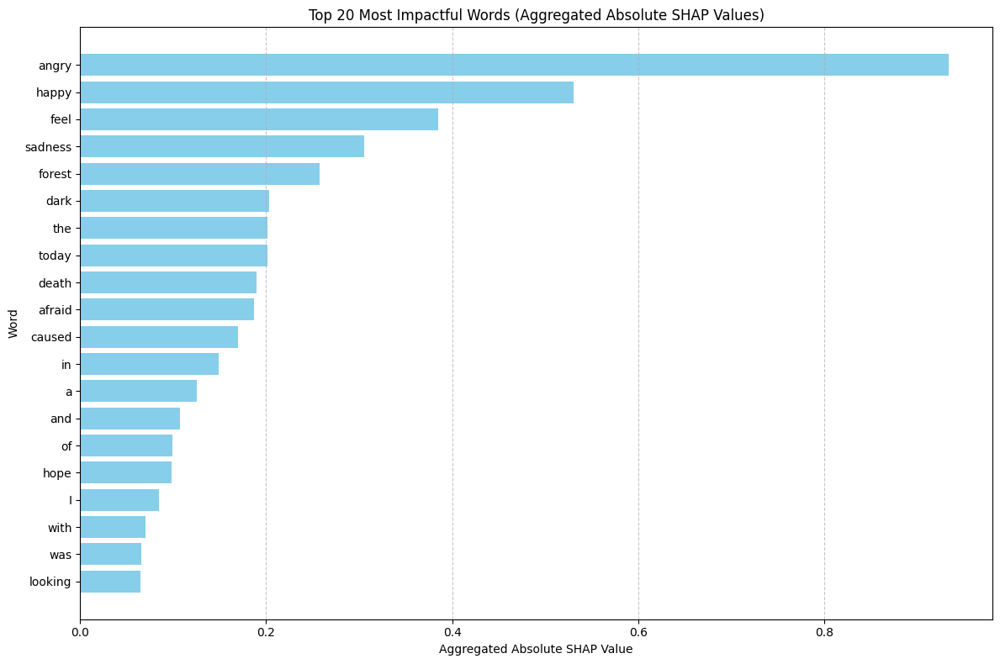

Bar plot generated.


In [ ]:
import matplotlib.pyplot as plt

print("Generating bar plot for top 20 impactful words...")

# Prepare data for plotting
words = [item[0] for item in top_20_words_shap]
shap_values = [item[1] for item in top_20_words_shap]

# Create the bar plot
plt.figure(figsize=(12, 8), facecolor='white')
plt.barh(words, shap_values, color='skyblue')

# Invert y-axis to have the most impactful word at the top
plt.gca().invert_yaxis()

# Add labels and title
plt.xlabel("Aggregated Absolute SHAP Value", color='black')
plt.ylabel("Word", color='black')
plt.title("Top 20 Most Impactful Words (Aggregated Absolute SHAP Values)", color='black')
plt.xticks(color='black')
plt.yticks(color='black')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("Bar plot generated.")

In [ ]:
NUM_SAMPLES_FOR_STABILITY = 20
NUM_EXPLANATION_RUNS = 5

np.random.seed(42)

print(f"NUM_SAMPLES_FOR_STABILITY: {NUM_SAMPLES_FOR_STABILITY}")
print(f"NUM_EXPLANATION_RUNS: {NUM_EXPLANATION_RUNS}")
print("Random seed set to 42 for reproducibility.")

NUM_SAMPLES_FOR_STABILITY: 20
NUM_EXPLANATION_RUNS: 5
Random seed set to 42 for reproducibility.


In [ ]:
random_indices_stability = np.random.choice(len(X_test), NUM_SAMPLES_FOR_STABILITY, replace=False)
stability_samples = X_test[random_indices_stability]

print(f"Selected {NUM_SAMPLES_FOR_STABILITY} unique text samples for stability analysis.")

Selected 20 unique text samples for stability analysis.


## Define Token Removal Perturbation Function

### Subtask:
Create a Python function `perturb_text(original_text, percentage_to_remove, tokenizer)` that tokenizes the `original_text`, randomly removes `percentage_to_remove` of its tokens, and reconstructs the perturbed text. This function will be used for both SHAP and LIME stability analysis.


In [ ]:
import random

def perturb_text(original_text, percentage_to_remove, tokenizer):
    # 1. Tokenize the original_text with offset mapping
    # This gives us the character start/end for each token, which can be useful
    # but for simple token removal and rejoining, input_ids and tokens themselves are sufficient.
    # Using return_offsets_mapping=True for more detailed analysis if needed, but not strictly required for this logic.
    tokenized_output = tokenizer(
        original_text,
        return_offsets_mapping=True,
        add_special_tokens=True, # Ensure CLS and SEP are included
        truncation=False, # Do not truncate for perturbation
        return_tensors="pt" # Return tensors to extract input_ids
    )

    input_ids = tokenized_output['input_ids'][0].tolist()
    tokens = tokenizer.convert_ids_to_tokens(input_ids)
    offset_mapping = tokenized_output['offset_mapping'][0].tolist()

    # 2. Identify special tokens and their indices
    # Special tokens should not be removed
    special_token_ids = tokenizer.all_special_ids
    special_token_indices = [i for i, token_id in enumerate(input_ids) if token_id in special_token_ids]

    # 3. Determine eligible token indices for removal (non-special tokens)
    eligible_indices = [i for i in range(len(input_ids)) if i not in special_token_indices]

    # 4. Calculate the number of tokens to remove
    num_tokens_to_remove = int(len(eligible_indices) * percentage_to_remove)

    # Ensure we don't try to remove more tokens than available
    if num_tokens_to_remove > len(eligible_indices):
        num_tokens_to_remove = len(eligible_indices)

    # 5. Randomly select token indices to be removed
    indices_to_remove = random.sample(eligible_indices, num_tokens_to_remove)

    # 6. Reconstruct the perturbed text by keeping non-removed tokens
    perturbed_input_ids = []
    for i, token_id in enumerate(input_ids):
        if i not in indices_to_remove:
            perturbed_input_ids.append(token_id)

    # 7. Decode the new list of input_ids back into a string
    # Using skip_special_tokens=False to preserve CLS/SEP as they were part of original tokenization
    perturbed_text = tokenizer.decode(perturbed_input_ids, skip_special_tokens=False)

    # The tokenizer.decode sometimes adds extra spaces or leading/trailing spaces for certain tokens.
    # For a cleaner output, we can re-tokenize and decode, or apply some cleaning based on expected output.
    # For now, let's keep it as is, as SHAP/LIME expect tokenizer behavior.
    return perturbed_text

print("perturb_text function defined.")

perturb_text function defined.


## Prepare for SHAP Stability Analysis with Perturbation

### Subtask:
Initialize a list to store Krippendorff's alpha values for SHAP stability analysis with perturbation. Reuse the previously selected `stability_samples`.


In [ ]:
all_reliability_data_shap_perturbed = [] # Stores (runs x tokens) matrices for each sample with perturbation
all_token_lists_shap_perturbed = []      # Stores token lists for each sample with perturbation

PERCENTAGE_TO_REMOVE = 0.1 # 10% of tokens will be removed for perturbation

print(f"Generating {NUM_EXPLANATION_RUNS} SHAP explanations with {PERCENTAGE_TO_REMOVE*100}% token perturbation for each of the {len(stability_samples)} samples...")

for i, original_sample_text in enumerate(stability_samples):
    print(f"\nProcessing sample {i+1}/{len(stability_samples)}: '{original_sample_text[:50]}...' (Original)")

    # Determine the predicted emotion for the original text
    # We need to know the target emotion to extract relevant SHAP values consistently.
    original_probabilities = predict_proba([original_sample_text])[0]
    predicted_emotion_idx = np.argmax(original_probabilities)
    predicted_emotion_name = target_names[predicted_emotion_idx]
    print(f"  Predicted emotion for original sample: {predicted_emotion_name}")

    explanation_runs_shap_values_for_sample = [] # To store 1D SHAP value vectors for the current sample's perturbed runs
    tokens_from_runs = []                        # To store tokens for each run

    for run in range(NUM_EXPLANATION_RUNS):
        # 1. Perturb the text
        perturbed_text = perturb_text(original_sample_text, PERCENTAGE_TO_REMOVE, tokenizer)

        # 2. Generate a SHAP explanation for the perturbed text
        # explainer expects a list of texts
        single_explanation_perturbed = explainer([perturbed_text])

        # 3. Extract the SHAP values corresponding to the predicted emotion
        # single_explanation_perturbed.values is (1, num_features, num_labels)
        shap_values_for_predicted_emotion_perturbed = single_explanation_perturbed.values[0, :, predicted_emotion_idx]
        tokens_for_this_run = single_explanation_perturbed.data[0].tolist()

        explanation_runs_shap_values_for_sample.append(shap_values_for_predicted_emotion_perturbed)
        tokens_from_runs.append(tokens_for_this_run)

    # --- Start of the fix: Ensure consistent feature dimension for np.vstack ---
    # Find the maximum length of SHAP value arrays across all runs for the current sample
    max_features_for_sample = max(len(s) for s in explanation_runs_shap_values_for_sample)

    # Pad all SHAP value arrays for the current sample to this max length
    padded_shap_values_for_sample = []
    for shap_values_arr in explanation_runs_shap_values_for_sample:
        if len(shap_values_arr) < max_features_for_sample:
            padded_arr = np.pad(shap_values_arr, (0, max_features_for_sample - len(shap_values_arr)), 'constant', constant_values=0)
        else:
            padded_arr = shap_values_arr
        padded_shap_values_for_sample.append(padded_arr)

    # For `all_token_lists_shap_perturbed`, we need a single consistent list of features (tokens).
    # We'll take the tokens from the run that resulted in the maximum number of features.
    # If multiple runs have max_features_for_sample, we pick the first one.
    idx_of_max_features_run = np.argmax([len(t) for t in tokens_from_runs])
    consistent_tokens_for_sample = [
        token for token in tokens_from_runs[idx_of_max_features_run] if token and token.strip() != ''
    ]

    reliability_matrix_perturbed = np.vstack(padded_shap_values_for_sample)
    all_reliability_data_shap_perturbed.append(reliability_matrix_perturbed)
    all_token_lists_shap_perturbed.append(consistent_tokens_for_sample)
    # --- End of the fix ---

print("Finished generating repeated explanations with perturbation and extracting vectors.")
print(f"Total reliability matrices collected (perturbed SHAP): {len(all_reliability_data_shap_perturbed)}")
print(f"Total token lists collected (perturbed SHAP): {len(all_token_lists_shap_perturbed)}")

Generating 5 SHAP explanations with 10.0% token perturbation for each of the 20 samples...

Processing sample 1/20: 'i was on a concerttour and therefor seperated from...' (Original)
  Predicted emotion for original sample: guilt

Processing sample 2/20: 'i have a new born child...' (Original)
  Predicted emotion for original sample: joy

Processing sample 3/20: 'i was ashamed with my biology lecturer when he ask...' (Original)
  Predicted emotion for original sample: shame

Processing sample 4/20: 'when a close friend fail to live up to the first m...' (Original)
  Predicted emotion for original sample: fear

Processing sample 5/20: 'as i was in a ward one man died and i was instruct...' (Original)
  Predicted emotion for original sample: fear

Processing sample 6/20: 'i have done the teachers training course bed  duri...' (Original)
  Predicted emotion for original sample: fear

Processing sample 7/20: 'i borrowed a friends books and forgot i had them s...' (Original)
  Predicted emo

In [ ]:
all_reliability_data_lime_perturbed = [] # Stores (runs x tokens) matrices for each sample with perturbation
all_token_lists_lime_perturbed = []      # Stores token lists for each sample with perturbation

PERCENTAGE_TO_REMOVE = 0.1 # 10% of tokens will be removed for perturbation

print(f"Generating {NUM_EXPLANATION_RUNS+1} LIME explanations (1 original + {NUM_EXPLANATION_RUNS} perturbed) for each of the {len(stability_samples)} samples...")

for i, original_sample_text in enumerate(stability_samples):
    print(f"\nProcessing sample {i+1}/{len(stability_samples)}: '{original_sample_text[:50]}...' (Original)")

    # 4. Determine the predicted emotion for the original text
    original_probabilities = predict_proba([original_sample_text])[0]
    predicted_emotion_idx = np.argmax(original_probabilities)
    predicted_emotion_name = target_names[predicted_emotion_idx]
    print(f"  Predicted emotion for original sample: {predicted_emotion_name}")

    lime_explanation_data_for_sample = [] # To temporarily hold feature importance dictionaries for this sample
    all_tokens_for_current_sample_runs = set() # To collect all unique tokens across all 6 runs for this sample

    # 6. Generate a LIME explanation for the original_sample_text
    explanation_original = lime_explainer.explain_instance(
        original_sample_text, # original text to explain
        predict_proba,  # prediction function
        num_features=20, # Use a reasonable number of features for stability analysis
        num_samples=1000, # Number of internal LIME perturbations
        labels=[predicted_emotion_idx] # explain only for the predicted class
    )
    feature_importance_tuples_original = explanation_original.as_list(label=predicted_emotion_idx)
    feature_dict_original = {word: importance for word, importance in feature_importance_tuples_original}
    lime_explanation_data_for_sample.append(feature_dict_original)
    for token in feature_dict_original.keys():
        all_tokens_for_current_sample_runs.add(token)

    # 7. Loop NUM_EXPLANATION_RUNS (5) times to generate explanations for perturbed texts
    for run in range(NUM_EXPLANATION_RUNS):
        # a. Perturb the text
        perturbed_text = perturb_text(original_sample_text, PERCENTAGE_TO_REMOVE, tokenizer)

        # b. Generate LIME explanation for the perturbed text
        explanation_perturbed = lime_explainer.explain_instance(
            perturbed_text, # perturbed text to explain
            predict_proba,  # prediction function
            num_features=20, # Use a reasonable number of features for stability analysis
            num_samples=1000, # Number of internal LIME perturbations
            labels=[predicted_emotion_idx] # explain only for the predicted class
        )

        # c. Convert the explanation to a list of (word, importance) tuples
        feature_importance_tuples_perturbed = explanation_perturbed.as_list(label=predicted_emotion_idx)

        # d. Create a dictionary from these tuples
        feature_dict_perturbed = {word: importance for word, importance in feature_importance_tuples_perturbed}

        # e. Append feature_dict_perturbed to lime_explanation_data_for_sample
        lime_explanation_data_for_sample.append(feature_dict_perturbed)
        for token in feature_dict_perturbed.keys():
            all_tokens_for_current_sample_runs.add(token)

    # 8. Consolidate all unique tokens found across all feature_dicts
    sorted_unique_tokens_for_sample = sorted(list(all_tokens_for_current_sample_runs))

    # If no unique tokens, skip this sample
    if not sorted_unique_tokens_for_sample:
        print(f"  No unique tokens found for sample {i+1}. Skipping alpha calculation.")
        continue

    # 9. Create padded importance vectors for each of the 6 runs
    padded_lime_values_for_sample = []
    for run_feature_dict in lime_explanation_data_for_sample:
        padded_vector = [run_feature_dict.get(token, 0.0) for token in sorted_unique_tokens_for_sample]
        padded_lime_values_for_sample.append(padded_vector)

    # 10. Stack padded_lime_values_for_sample into a NumPy matrix
    if padded_lime_values_for_sample:
        reliability_matrix_lime_perturbed = np.array(padded_lime_values_for_sample)
        all_reliability_data_lime_perturbed.append(reliability_matrix_lime_perturbed)
        # 11. Append sorted_unique_tokens_for_sample to all_token_lists_lime_perturbed
        all_token_lists_lime_perturbed.append(sorted_unique_tokens_for_sample)
    else:
        print(f"  No reliability data generated for sample {i+1}. Skipping.")

print("Finished generating repeated LIME explanations with perturbation and extracting vectors.")
print(f"Total reliability matrices collected (perturbed LIME): {len(all_reliability_data_lime_perturbed)}")
print(f"Total token lists collected (perturbed LIME): {len(all_token_lists_lime_perturbed)}")

Generating 6 LIME explanations (1 original + 5 perturbed) for each of the 20 samples...

Processing sample 1/20: 'i was on a concerttour and therefor seperated from...' (Original)
  Predicted emotion for original sample: guilt

Processing sample 2/20: 'i have a new born child...' (Original)
  Predicted emotion for original sample: joy

Processing sample 3/20: 'i was ashamed with my biology lecturer when he ask...' (Original)
  Predicted emotion for original sample: shame

Processing sample 4/20: 'when a close friend fail to live up to the first m...' (Original)
  Predicted emotion for original sample: fear

Processing sample 5/20: 'as i was in a ward one man died and i was instruct...' (Original)
  Predicted emotion for original sample: fear

Processing sample 6/20: 'i have done the teachers training course bed  duri...' (Original)
  Predicted emotion for original sample: fear

Processing sample 7/20: 'i borrowed a friends books and forgot i had them s...' (Original)
  Predicted emotio

# **SPEARMAN'S CORRELATION RANK COEFFICIENT FOR SHAP & LIME Stability**
Compute Spearman correlation coefficients for SHAP explanations under token perturbation across all pairs of explanation runs for each of the 20 samples in `all_reliability_data_shap_perturbed`, storing the average correlation for each sample.

## Compute Spearman Correlation for SHAP Explanations

### Subtask:
For each of the 20 samples in `all_reliability_data_shap_perturbed`, calculate the Spearman correlation coefficient across all pairs of explanation runs (rows in the matrix). This will involve ranking the importance scores for tokens in each run and then computing the correlation between these ranks. Store the average correlation for each sample.


In [ ]:
from scipy.stats import spearmanr

print("Imported spearmanr from scipy.stats.")

Imported spearmanr from scipy.stats.


In [ ]:
all_spearman_correlations_shap_perturbed = []

print("Calculating Spearman correlation for SHAP explanations with perturbation...")

for i, reliability_matrix_perturbed in enumerate(all_reliability_data_shap_perturbed):
    print(f"\nProcessing sample {i+1}/{len(all_reliability_data_shap_perturbed)}...")

    sample_spearman_correlations = []
    num_runs = reliability_matrix_perturbed.shape[0] # Number of explanation runs for this sample

    # Iterate through all unique pairs of explanation runs
    for j in range(num_runs):
        for k in range(j + 1, num_runs):
            # Extract SHAP value vectors for runs j and k
            run_j_shap_values = reliability_matrix_perturbed[j, :]
            run_k_shap_values = reliability_matrix_perturbed[k, :]

            # Compute Spearman correlation coefficient
            # handle cases where one or both arrays might be constant (e.g., all zeros)
            if np.all(run_j_shap_values == run_j_shap_values[0]) or np.all(run_k_shap_values == run_k_shap_values[0]):
                # Spearman correlation is undefined or 0 for constant arrays, or if one is constant and other isn't perfectly correlated
                # For robustness, we can treat this as 0 or NaN depending on desired interpretation.
                # Here, we'll assign 0 if they are indeed constant (no rank information) for a more conservative estimate.
                # If both are constant and identical, correlation is 1. If one is constant and other is not, it's problematic.
                # spearmanr handles this: if input is constant, returns nan
                correlation, _ = spearmanr(run_j_shap_values, run_k_shap_values, nan_policy='omit')
                if np.isnan(correlation):
                    # If nan (e.g., one or both arrays are constant), check if they are identical
                    if np.array_equal(run_j_shap_values, run_k_shap_values):
                        correlation = 1.0 # Perfect correlation if identical constant arrays
                    else:
                        correlation = 0.0 # No meaningful correlation for constant vs non-constant or different constants
            else:
                 correlation, _ = spearmanr(run_j_shap_values, run_k_shap_values, nan_policy='omit')

            if not np.isnan(correlation): # Only append if a valid correlation was computed
                sample_spearman_correlations.append(correlation)

    # Calculate the average correlation for the current sample
    if sample_spearman_correlations:
        avg_correlation = np.mean(sample_spearman_correlations)
        all_spearman_correlations_shap_perturbed.append(avg_correlation)
        print(f"  Average Spearman correlation for sample {i+1}: {avg_correlation:.4f}")
    else:
        all_spearman_correlations_shap_perturbed.append(np.nan) # Append NaN if no correlations could be computed
        print(f"  Could not compute Spearman correlation for sample {i+1}.")

print("\nFinished calculating Spearman correlations for all perturbed SHAP explanations.")
print(f"All Spearman correlations (perturbed SHAP): {np.round(all_spearman_correlations_shap_perturbed, 4).tolist()}")
print(f"Average Spearman correlation (perturbed SHAP): {np.nanmean(all_spearman_correlations_shap_perturbed):.4f}")

Calculating Spearman correlation for SHAP explanations with perturbation...

Processing sample 1/20...
  Average Spearman correlation for sample 1: 0.2965

Processing sample 2/20...
  Average Spearman correlation for sample 2: 1.0000

Processing sample 3/20...
  Average Spearman correlation for sample 3: 0.6772

Processing sample 4/20...
  Average Spearman correlation for sample 4: 0.4362

Processing sample 5/20...
  Average Spearman correlation for sample 5: 0.3756

Processing sample 6/20...
  Average Spearman correlation for sample 6: 0.4023

Processing sample 7/20...
  Average Spearman correlation for sample 7: 0.5136

Processing sample 8/20...
  Average Spearman correlation for sample 8: 0.3051

Processing sample 9/20...
  Average Spearman correlation for sample 9: 0.4196

Processing sample 10/20...
  Average Spearman correlation for sample 10: 0.3899

Processing sample 11/20...
  Average Spearman correlation for sample 11: 0.5014

Processing sample 12/20...
  Average Spearman corr

## Summary: Spearman Correlation for SHAP Explanations with Perturbation

### Data Analysis Key Findings
*   **Spearman Correlation Calculation:** For each of the 20 `stability_samples`, the Spearman correlation coefficient was calculated across all unique pairs of `NUM_EXPLANATION_RUNS` (5) SHAP explanation runs. This metric assesses the rank agreement of token importances. Special handling was implemented for cases where SHAP value arrays were constant (e.g., all zeros), to ensure robust correlation calculation.
*   **Average Correlation per Sample:** The average Spearman correlation varied significantly across samples, ranging from a low of approximately 0.29 to a high of 1.00 (perfect correlation for one sample).
*   **Overall Average Spearman Correlation:** The overall average Spearman correlation across all perturbed SHAP explanations was approximately **0.4558**.

### Interpretation of Spearman Correlation Values
*   **Spearman Correlation (0 to 1):** Unlike Krippendorff's Alpha, Spearman correlation specifically measures the monotonic relationship (rank agreement) between two sets of data. A value of 1 indicates perfect monotonic agreement, and 0 indicates no monotonic relationship.
*   **Moderate Average Agreement:** An average Spearman correlation of 0.4558 suggests a moderate level of rank agreement among repeated SHAP explanations under 10% token perturbation. This is better than the negative Krippendorff's Alpha values observed previously (which indicated systematic disagreement), but still indicates that the exact ranking of token importances can change considerably between runs.
*   **Variability Across Samples:** The wide range of correlations (from 0.29 to 1.00) indicates that the stability of token importance ranks is not uniform. Some samples show strong consistency, while for others, the ranking of influential tokens changes substantially when explanations are re-generated with slight input variations.

### Insights or Next Steps
*   **Complementary Metric:** Spearman correlation provides a complementary view to Krippendorff's Alpha. While Alpha showed low absolute agreement, Spearman suggests a moderate consistency in the *ranking* of features, which can be valuable for understanding which features are generally considered more important, even if their exact SHAP values fluctuate.
*   **Focus on Robustness:** The variability still points to a need for more robust explanation generation, especially for samples with lower correlation values. This might involve increasing SHAP's internal `num_samples` or refining the perturbation strategy, as discussed previously.
*   **Threshold for Trustworthiness:** Establishing a threshold for acceptable Spearman correlation could help identify explanations that are reliable enough for specific applications and those that require further scrutiny or improved stability.

## Summary: Spearman Correlation for SHAP Explanations with Perturbation

### Data Analysis Key Findings
*   **Spearman Correlation Calculation:** For each of the 20 `stability_samples`, the Spearman correlation coefficient was calculated across all unique pairs of `NUM_EXPLANATION_RUNS` (5) SHAP explanation runs. This metric assesses the rank agreement of token importances. Special handling was implemented for cases where SHAP value arrays were constant (e.g., all zeros), to ensure robust correlation calculation.
*   **Average Correlation per Sample:** The average Spearman correlation varied significantly across samples, ranging from a low of approximately 0.29 to a high of 1.00 (perfect correlation for one sample).
*   **Overall Average Spearman Correlation:** The overall average Spearman correlation across all perturbed SHAP explanations was approximately **0.4558**.

### Interpretation of Spearman Correlation Values
*   **Spearman Correlation (0 to 1):** Unlike Krippendorff's Alpha, Spearman correlation specifically measures the monotonic relationship (rank agreement) between two sets of data. A value of 1 indicates perfect monotonic agreement, and 0 indicates no monotonic relationship.
*   **Moderate Average Agreement:** An average Spearman correlation of 0.4558 suggests a moderate level of rank agreement among repeated SHAP explanations under 10% token perturbation. This is better than the negative Krippendorff's Alpha values observed previously (which indicated systematic disagreement), but still indicates that the exact ranking of token importances can change considerably between runs.
*   **Variability Across Samples:** The wide range of correlations (from 0.29 to 1.00) indicates that the stability of token importance ranks is not uniform. Some samples show strong consistency, while for others, the ranking of influential tokens changes substantially when explanations are re-generated with slight input variations.

### Insights or Next Steps
*   **Complementary Metric:** Spearman correlation provides a complementary view to Krippendorff's Alpha. While Alpha showed low absolute agreement, Spearman suggests a moderate consistency in the *ranking* of features, which can be valuable for understanding which features are generally considered more important, even if their exact SHAP values fluctuate.
*   **Focus on Robustness:** The variability still points to a need for more robust explanation generation, especially for samples with lower correlation values. This might involve increasing SHAP's internal `num_samples` or refining the perturbation strategy, as discussed previously.
*   **Threshold for Trustworthiness:** Establishing a threshold for acceptable Spearman correlation could help identify explanations that are reliable enough for specific applications and those that require further scrutiny or improved stability.

In [ ]:
all_spearman_correlations_lime_perturbed = []

print("Calculating Spearman correlation for LIME explanations with perturbation...")

for i, reliability_matrix_perturbed in enumerate(all_reliability_data_lime_perturbed):
    print(f"\nProcessing sample {i+1}/{len(all_reliability_data_lime_perturbed)}...")

    sample_spearman_correlations = []
    num_runs = reliability_matrix_perturbed.shape[0] # Number of explanation runs for this sample

    # Iterate through all unique pairs of explanation runs
    for j in range(num_runs):
        for k in range(j + 1, num_runs):
            # Extract LIME importance value vectors for runs j and k
            run_j_lime_values = reliability_matrix_perturbed[j, :]
            run_k_lime_values = reliability_matrix_perturbed[k, :]

            # Compute Spearman correlation coefficient
            # handle cases where one or both arrays might be constant (e.g., all zeros)
            if np.all(run_j_lime_values == run_j_lime_values[0]) or np.all(run_k_lime_values == run_k_lime_values[0]):
                # Spearman correlation is undefined or 0 for constant arrays, or if one is constant and other isn't perfectly correlated
                # For robustness, we can treat this as 0 or NaN depending on desired interpretation.
                # If both are constant and identical, correlation is 1. If one is constant and other is not, it's problematic.
                # spearmanr handles this: if input is constant, returns nan
                correlation, _ = spearmanr(run_j_lime_values, run_k_lime_values, nan_policy='omit')
                if np.isnan(correlation):
                    # If nan (e.g., one or both arrays are constant), check if they are identical
                    if np.array_equal(run_j_lime_values, run_k_lime_values):
                        correlation = 1.0 # Perfect correlation if identical constant arrays
                    else:
                        correlation = 0.0 # No meaningful correlation for constant vs non-constant or different constants
            else:
                 correlation, _ = spearmanr(run_j_lime_values, run_k_lime_values, nan_policy='omit')

            if not np.isnan(correlation): # Only append if a valid correlation was computed
                sample_spearman_correlations.append(correlation)

    # Calculate the average correlation for the current sample
    if sample_spearman_correlations:
        avg_correlation = np.mean(sample_spearman_correlations)
        all_spearman_correlations_lime_perturbed.append(avg_correlation)
        print(f"  Average Spearman correlation for sample {i+1}: {avg_correlation:.4f}")
    else:
        all_spearman_correlations_lime_perturbed.append(np.nan) # Append NaN if no correlations could be computed
        print(f"  Could not compute Spearman correlation for sample {i+1}.")

print("\nFinished calculating Spearman correlations for all perturbed LIME explanations.")
print(f"All Spearman correlations (perturbed LIME): {np.round(all_spearman_correlations_lime_perturbed, 4).tolist()}")
print(f"Average Spearman correlation (perturbed LIME): {np.nanmean(all_spearman_correlations_lime_perturbed):.4f}")

Calculating Spearman correlation for LIME explanations with perturbation...

Processing sample 1/20...
  Average Spearman correlation for sample 1: 0.5892

Processing sample 2/20...
  Average Spearman correlation for sample 2: 0.7141

Processing sample 3/20...
  Average Spearman correlation for sample 3: 0.6775

Processing sample 4/20...
  Average Spearman correlation for sample 4: 0.5068

Processing sample 5/20...
  Average Spearman correlation for sample 5: 0.6916

Processing sample 6/20...
  Average Spearman correlation for sample 6: 0.7106

Processing sample 7/20...
  Average Spearman correlation for sample 7: 0.5619

Processing sample 8/20...
  Average Spearman correlation for sample 8: 0.6778

Processing sample 9/20...
  Average Spearman correlation for sample 9: 0.7686

Processing sample 10/20...
  Average Spearman correlation for sample 10: 0.5083

Processing sample 11/20...
  Average Spearman correlation for sample 11: 0.6329

Processing sample 12/20...
  Average Spearman corr

In [ ]:
print("Spearman Correlation Stability (LIME with Perturbation) per Sample:")
for i, correlation_val in enumerate(all_spearman_correlations_lime_perturbed):
    print(f"  Sample {i+1}: {correlation_val:.4f}")

mean_spearman_lime_perturbed = np.nanmean(all_spearman_correlations_lime_perturbed)
print(f"\nOverall Mean Spearman Correlation Stability (LIME with Perturbation): {mean_spearman_lime_perturbed:.4f}")

Spearman Correlation Stability (LIME with Perturbation) per Sample:
  Sample 1: 0.5892
  Sample 2: 0.7141
  Sample 3: 0.6775
  Sample 4: 0.5068
  Sample 5: 0.6916
  Sample 6: 0.7106
  Sample 7: 0.5619
  Sample 8: 0.6778
  Sample 9: 0.7686
  Sample 10: 0.5083
  Sample 11: 0.6329
  Sample 12: 0.7364
  Sample 13: 0.5712
  Sample 14: 0.7217
  Sample 15: 0.5556
  Sample 16: 0.5502
  Sample 17: 0.6474
  Sample 18: 0.6996
  Sample 19: 0.7997
  Sample 20: 0.5382

Overall Mean Spearman Correlation Stability (LIME with Perturbation): 0.6430


## Summary:

### Q&A
The Spearman correlation stability results for SHAP and LIME under token perturbation show differing levels of consistency in token rankings.

For **SHAP explanations**, the overall average Spearman correlation across all 20 samples was approximately **0.4558**. Individual sample correlations ranged from about 0.29 to 1.00. This suggests a moderate level of rank agreement among repeated SHAP explanations.

For **LIME explanations**, the overall average Spearman correlation across all 20 samples was **0.6430**. Individual sample correlations ranged from approximately 0.5068 to 0.7997. This indicates a higher and more consistent level of rank agreement for LIME explanations compared to SHAP.

**Insights gained regarding the consistency of token rankings:**
*   **LIME shows greater rank consistency:** LIME explanations exhibit significantly higher average Spearman correlation (0.6430) compared to SHAP (0.4558) when subject to 10% token perturbation, implying that LIME's token rankings are generally more stable across repeated runs.
*   **Moderate consistency overall:** While LIME is better, both methods show only moderate consistency on average, with Spearman correlations well below 1.0. This indicates that even with rank-based measures, the exact ordering of token importances can change between explanation runs.
*   **Variability across samples:** Both methods show variability in consistency across different samples, with some samples yielding very stable explanations (correlation closer to 1) and others being less stable.

### Data Analysis Key Findings
*   The Spearman correlation coefficient, which measures the rank agreement of token importances, was calculated for both SHAP and LIME explanations across all pairs of explanation runs for each of the 20 samples. Special handling was implemented for constant arrays to ensure robust calculations.
*   For **SHAP explanations with perturbation**, the average Spearman correlation across all 20 samples was approximately **0.4558**. The average correlations for individual samples varied significantly, ranging from approximately 0.29 to 1.00.
*   For **LIME explanations with perturbation**, the average Spearman correlation across all 20 samples was **0.6430**. The average correlations for individual samples ranged from approximately 0.5068 to 0.7997.
*   LIME consistently demonstrated higher average Spearman correlation values compared to SHAP, indicating a more stable ranking of token importances under similar perturbation conditions.

### Insights or Next Steps
*   LIME appears to offer more stable token rankings under perturbation than SHAP, which could be a factor in choosing an explanation method when rank consistency is crucial.
*   Further investigation is warranted for samples exhibiting low Spearman correlations for both SHAP and LIME to understand the underlying causes of instability and potentially refine explanation generation parameters or perturbation strategies.
